## importe des librairies nécessaires

In [1]:
import cv2
import glob as gb
import numpy as np
import matplotlib.pylab as plt

## Fonction de mise en correspondance

In [2]:
def sift_matches(img1, img2, match_ratio, shrink, display_matches=False):

    if img1.ndim > 2:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    if img2.ndim > 2:
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    if shrink < 1:
        img1 = cv2.resize(
            img1, (0, 0), fx=shrink, fy=shrink, interpolation=cv2.INTER_CUBIC
        )
        img2 = cv2.resize(
            img2, (0, 0), fx=shrink, fy=shrink, interpolation=cv2.INTER_CUBIC
        )

    # Initiate SIFT detector
    sift = cv2.SIFT_create()
    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    bf = cv2.BFMatcher()
    all_matches = bf.knnMatch(des1, des2, k=2)

    matches = np.asarray(
        [[m] for m, d in all_matches if m.distance < match_ratio * d.distance]
    )

    if display_matches:
        # draw good matches
        matchedKnn_img = cv2.drawMatchesKnn(
            img1, kp1, img2, kp2, matches, img1, matchColor=(0, 255, 0), flags=2
        )
        # show matching image
        plt.imshow(matchedKnn_img[:, :, ::-1]), plt.title(
            "SIFT's good matches"
        ), plt.axis("off")
        plt.show()

    return matches


## Extraction des matricules

In [3]:
from extract_mat import extract_mat

car_path = "./dataset/car"
mat_path = "./dataset/mat"

extract_mat(car_path, mat_path)


Loading model successfully...
image 0 saved!!
image 1 saved!!
image 2 saved!!
image 3 saved!!
image 4 saved!!
image 5 saved!!
image 6 saved!!
image 7 saved!!
image 8 saved!!
image 9 saved!!
image 10 saved!!
image 11 saved!!
image 12 saved!!
image 13 saved!!
image 14 saved!!
image 15 saved!!
image 16 saved!!
image 17 saved!!
image 18 saved!!
image 19 saved!!
image 20 saved!!
image 21 saved!!
image 22 saved!!
image 23 saved!!
image 24 saved!!
image 25 saved!!
image 26 saved!!
image 27 saved!!


## Lecture des images (voitures, matricules)

In [4]:
car_images_path = sorted(gb.glob(car_path+"/*.jpg"), key=len)
cars = [cv2.imread(img) for img in car_images_path]
print(f"numbre of cars ... {len(car_images_path)}")

mat_images_path = sorted(gb.glob(mat_path+"/*.jpg"), key=len)
mats = [cv2.imread(img) for img in mat_images_path]
print(f"numbre of license plates ... {len(mat_images_path)}")


numbre of cars ... 28
numbre of license plates ... 28


## Trouver la voiture qui correspond à chaque matricule

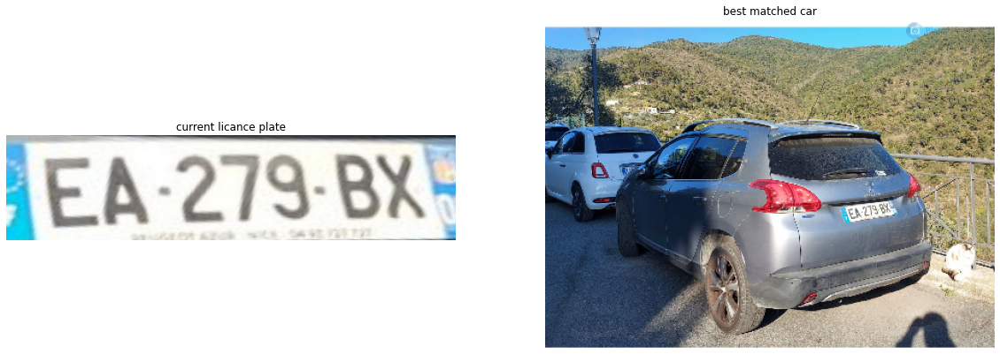

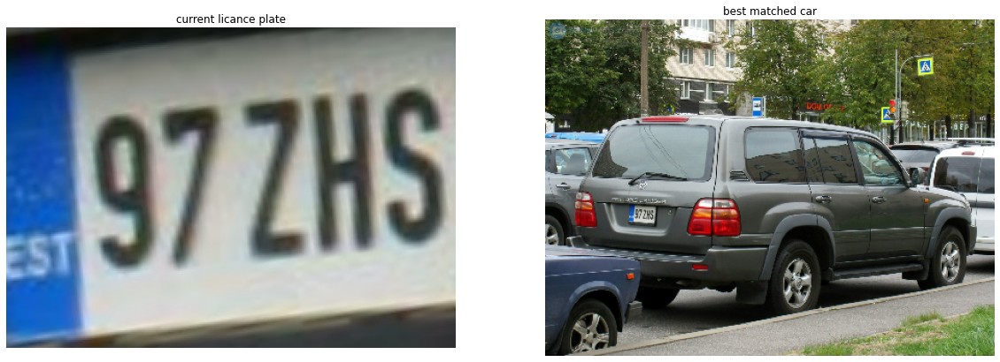

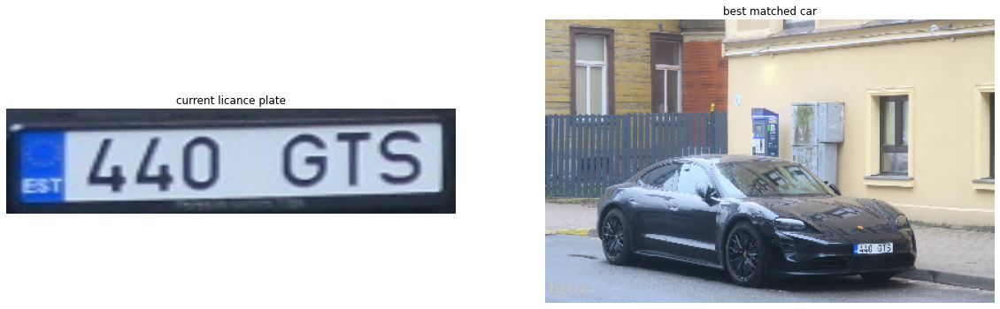

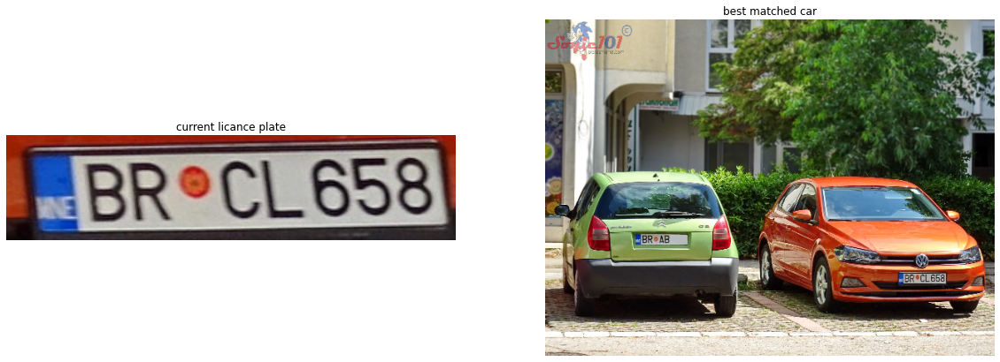

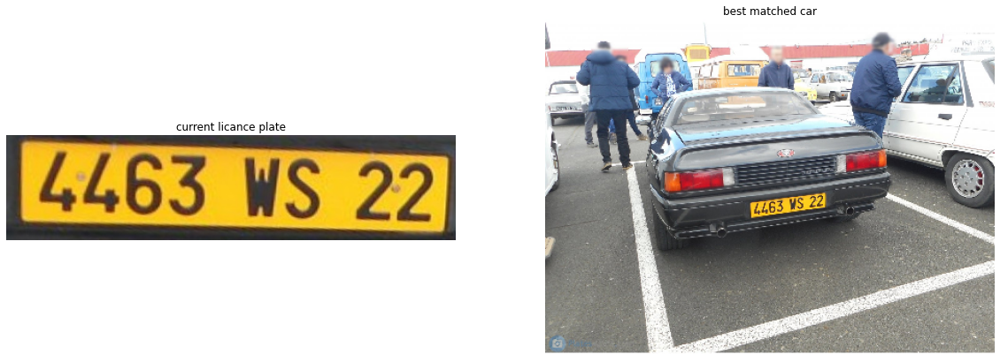

...

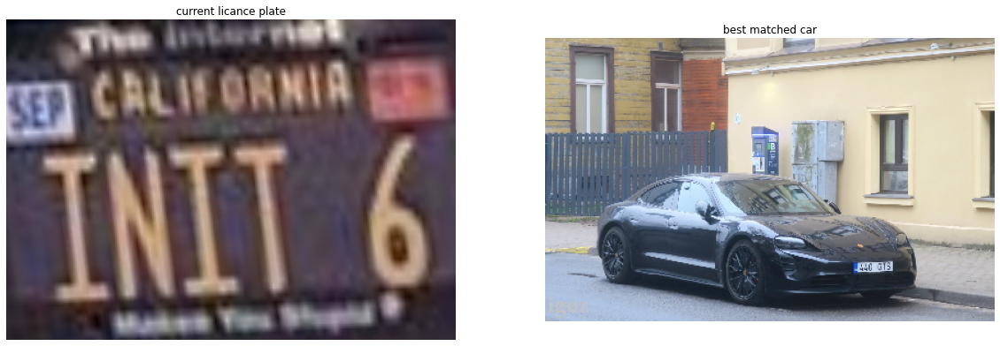

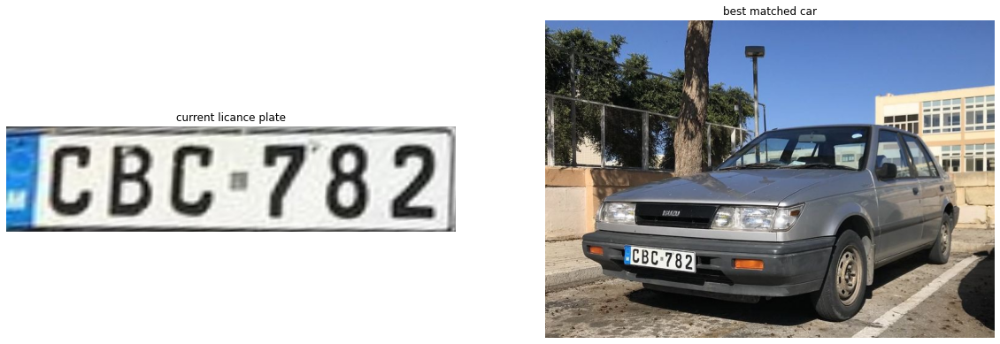

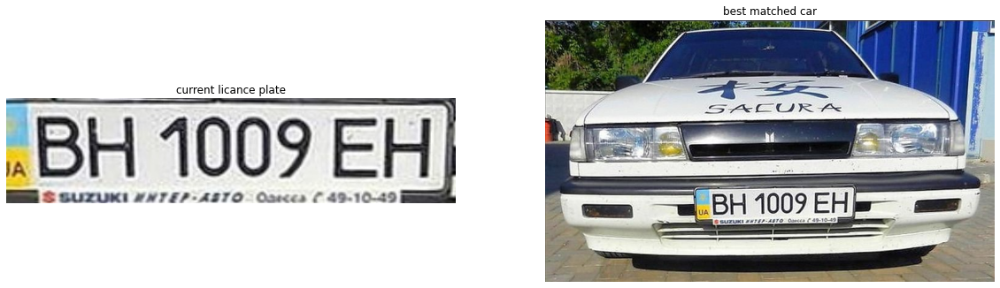

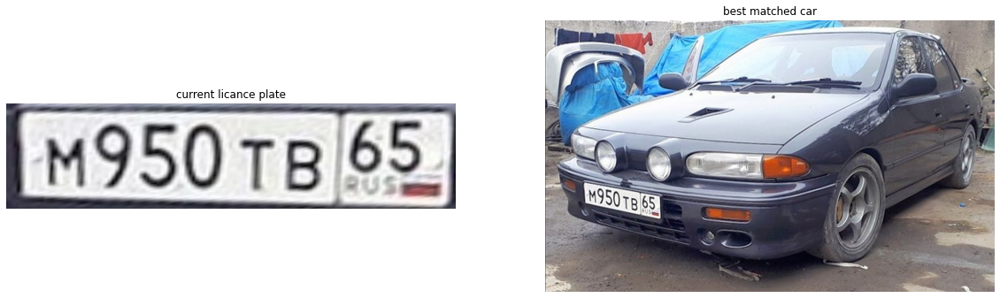

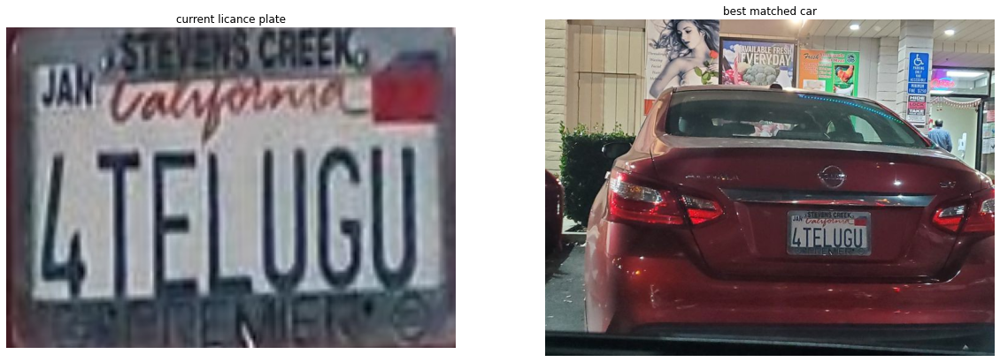

In [5]:

for indx, mat in enumerate(mats):
    lst = np.array([])
    for idx_car, car in enumerate(cars):
        matches = sift_matches(mat, car, match_ratio=0.75, shrink=0.7, display_matches=False)
        lst = np.append(lst, len(matches))

    max_idx = lst.argsort()[-1]
    find_car = cars[max_idx]
    if find_car.shape[0] > 700 and find_car.shape[1] > 700:
        find_car = cv2.resize(
            find_car, (0, 0), fx=0.3, fy=0.3, interpolation=cv2.INTER_CUBIC
        )
    # print("mat", indx)
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.imshow(mat[:, :, ::-1]), plt.title("current licance plate"), plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(find_car[:, :, ::-1]), plt.title("best matched car"), plt.axis('off')
    
    plt.show()
